<a href="https://colab.research.google.com/github/abroniewski/Child-Wasting-Prediction/blob/main/notebooks/Acled_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

EDA of Conflict Data

In [1]:
!pip install geopandas
!pip install pandas-profiling==3.3.0
#!pip install Shapely
#!pip install matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 5.3 MB/s 
     |████████████████████████████████| 6.3 MB 35.9 MB/s 
     |████████████████████████████████| 16.7 MB 373 kB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 268 kB 4.1 MB/s 
     |████████████████████████████████| 4.7 MB 41.9 MB/s 
     |████████████████████████████████| 690 kB 42.0 MB/s 
     |████████████████████████████████| 62 kB 1.1 MB/s 
     |████████████████████████████████| 9.8 MB 30.7 MB/s 
     |████████████████████████████████| 102 kB 48.5 MB/s 
     |████████████████████████████████| 296 kB 41.0 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=046a89d8018fe55adde49c2d507b9eb820a69f169509d4ad21acec3b99194846
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba8687688

In [2]:
# General imports
import pandas as pd
from pandas_profiling import ProfileReport

# Plotting imports
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
%matplotlib inline
import matplotlib.pyplot as plt # plotting
import numpy as np 
import seaborn as sns
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame
import plotly.express as px

In [3]:
# Confihuration setting
data_dir = "https://raw.githubusercontent.com/abroniewski/Child-Wasting-Prediction/main/data/raw/1900-01-01-2022-09-27-Eastern_Africa-Somalia.csv"

# For pandas
pd.options.display.max_columns = 200 # display upto 200 columns (instead of default 20)
pd.options.display.max_rows = 200 # display upto 200 rows (instead of default 60)

In [4]:
# Read data
conflict_df = pd.read_csv(data_dir)

In [5]:
conflict_df.head(1)

,data_id,iso,event_id_cnty,event_id_no_cnty,event_date,year,time_precision,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,assoc_actor_2,inter2,interaction,region,country,admin1,admin2,admin3,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,timestamp,iso3
0,9499027,706,SOM38074,38074,23 September 2022,2022,1,Explosions/Remote violence,Shelling/artillery/missile attack,Al Shabaab,NaN,2,ATMIS: African Union Transition Mission in Som...,NaN,8,28,Eastern Africa,Somalia,Lower Juba,Kismaayo,NaN,Abdale Birole,-0.4906,42.1969,1,Calamada; Al Furqaan,National,"On 23 September 2022, Al Shabaab militants fir...",0,1664231916,SOM


In [6]:
# Basic checks
print(conflict_df.shape)


(37782, 31)


In [7]:
# Dropping the unnecessary columns
df_clean = conflict_df.drop(labels=['data_id','iso','event_id_cnty','event_id_no_cnty','year','time_precision','region','country','geo_precision','timestamp','iso3'],axis=1)
# Converting the event_date to correct format
df_clean['event_date'] = pd.to_datetime(df_clean['event_date'])

In [8]:

df_clean.head(2)


,event_date,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,assoc_actor_2,inter2,interaction,admin1,admin2,admin3,location,latitude,longitude,source,source_scale,notes,fatalities
0,2022-09-23,Explosions/Remote violence,Shelling/artillery/missile attack,Al Shabaab,NaN,2,ATMIS: African Union Transition Mission in Som...,NaN,8,28,Lower Juba,Kismaayo,NaN,Abdale Birole,-0.4906,42.1969,Calamada; Al Furqaan,National,"On 23 September 2022, Al Shabaab militants fir...",0
1,2022-09-23,Battles,Armed clash,Al Shabaab,NaN,2,Military Forces of Somalia (2022-),NaN,1,12,Lower Shabelle,Afgooye,NaN,Almada,2.2187,45.2087,Al Furqaan; Calamada,National,"On 23 September 2022, overnight, Al Shabaab mi...",0


In [9]:
#For checking the unique values in the dataset
df_clean.nunique()

event_date         6643
event_type            6
sub_event_type       24
actor1              690
assoc_actor_1       330
inter1                8
actor2              574
assoc_actor_2       820
inter2                9
interaction          40
admin1               18
admin2               74
admin3                0
location           1564
latitude           1548
longitude          1533
source             1007
source_scale         23
notes             34975
fatalities           72
dtype: int64

In [10]:
#Checking for NUll values in the dataset
df_clean.isnull().sum()

event_date            0
event_type            0
sub_event_type        0
actor1                0
assoc_actor_1     35019
inter1                0
actor2             2913
assoc_actor_2     32049
inter2                0
interaction           0
admin1                0
admin2                0
admin3            37782
location              0
latitude              0
longitude             0
source                0
source_scale          0
notes              1725
fatalities            0
dtype: int64

Here we can see that assoc_actor_1, assoc_actor_2 and admin3 have a lot of NULL values where : <br>
assoc_actor_1 = The named actor associated with or identifying actor1 <br>
assoc_actor_2 = The named actor associated with or identifying actor2 <br>
admin3 = The third largest sub-national administrative region in which
the event took place

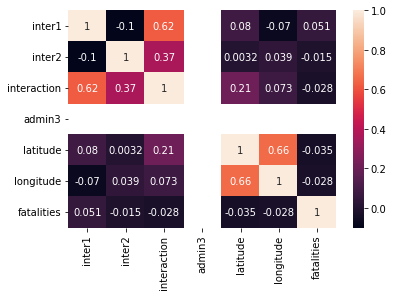

In [11]:
#Plotting the heatmap for correlation matrix
correlation = df_clean.corr()
sns.heatmap(correlation, xticklabels=correlation.columns, yticklabels=correlation.columns, annot=True)

Here, <br>
INTER1 = A numeric code indicating the type of ACTOR1 i.e. the one causing the event<br>
INTER2 = A numeric code indicating the type of ACTOR2 i.e. the one opposing the event<br>
INTERACTION =  A numeric code indicating the interaction between types of
ACTOR1 and ACTOR2 <br>


ACLED Event Type : Maybe we can focus on the "Violent events" as manily the fatalities occur in here.

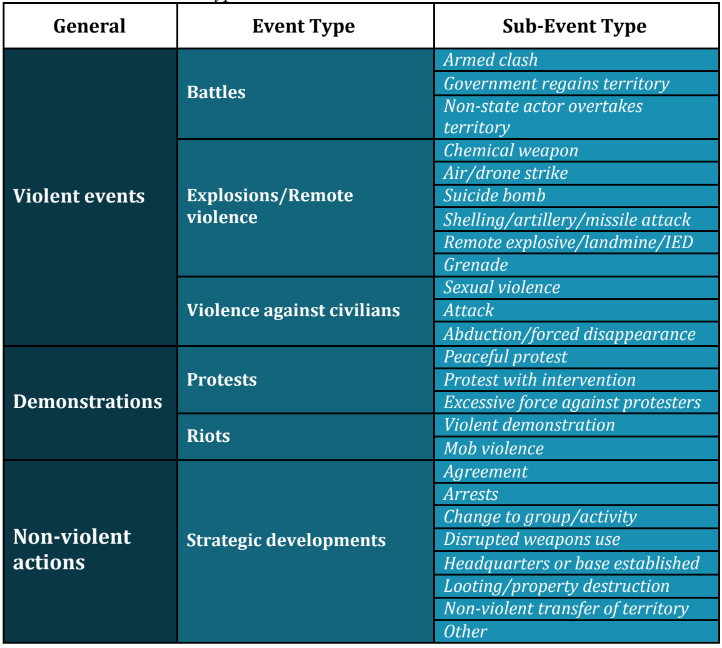

In [12]:
# Histogram of column data
def plotHistogram(df, nHistogramShown, nHistogramPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]] # For displaying purposes, pick columns that have between 1 and 50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    nHistRow = (nCol + nHistogramPerRow - 1) / nHistogramPerRow
    plt.figure(num=None, figsize=(6*nHistogramPerRow, 8*nHistRow), dpi=80, facecolor='w', edgecolor='k')
    for i in range(min(nCol, nHistogramShown)):
        plt.subplot(nHistRow, nHistogramPerRow, i+1)
        df.iloc[:,i].hist()
        plt.ylabel('counts')
        plt.xticks(rotation=90)
        plt.title(f'{columnNames[i]} (column {i})')
    plt.tight_layout(pad=1.0, w_pad=1.0, h_pad=1.0)
    plt.show()

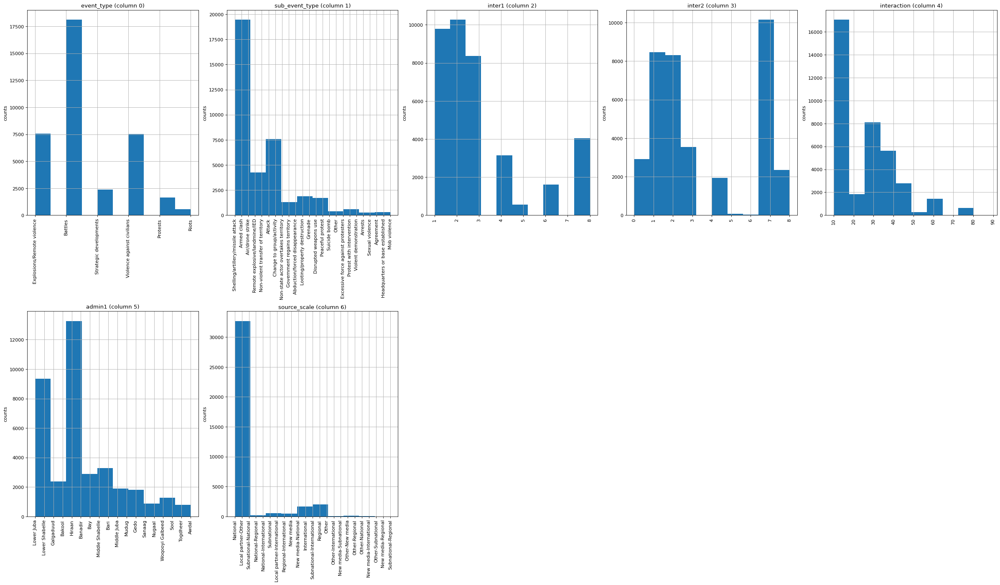

In [13]:
plotHistogram(df_clean, 10, 5)

In [14]:
# Scatter and density plots
def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df = df.dropna('columns')
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    if len(columnNames) > 10: # reduce the number of columns for matrix inversion of kernel density plots
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.dropna will be keyword-only
  """


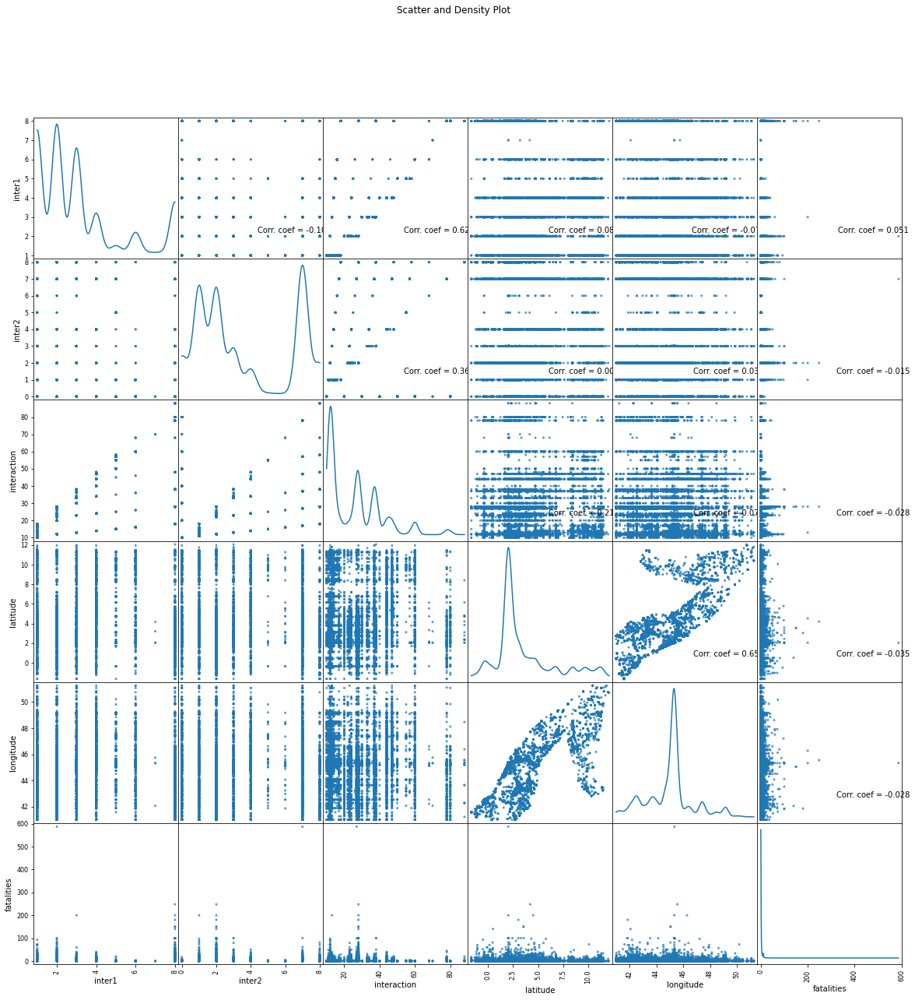

In [15]:
plotScatterMatrix(df_clean, 20, 10)

In [16]:
# SELF-EXPLORATION
# NOTE : Maybe this is not required currently I just wanted to visualize the data geographically for the fatalities
# Graph showing the regions with fatalities with hover-around feature
fig = px.scatter_geo(df_clean,lat='latitude',lon='longitude',hover_name='fatalities')
fig.update_layout(title = 'Conflict data of Somalia - 1997-2022', title_x=1)
fig.show()

## Pandas profiling section

In [17]:
import pandas as pd
from pandas_profiling import ProfileReport

In [18]:
data_dir = "https://raw.githubusercontent.com/abroniewski/Child-Wasting-Prediction/main/data/raw/1900-01-01-2022-09-27-Eastern_Africa-Somalia.csv"
acled_df = pd.read_csv(data_dir, parse_dates=['event_date'])
acled_df.head(1)

,data_id,iso,event_id_cnty,event_id_no_cnty,event_date,year,time_precision,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,assoc_actor_2,inter2,interaction,region,country,admin1,admin2,admin3,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,timestamp,iso3
0,9499027,706,SOM38074,38074,2022-09-23,2022,1,Explosions/Remote violence,Shelling/artillery/missile attack,Al Shabaab,NaN,2,ATMIS: African Union Transition Mission in Som...,NaN,8,28,Eastern Africa,Somalia,Lower Juba,Kismaayo,NaN,Abdale Birole,-0.4906,42.1969,1,Calamada; Al Furqaan,National,"On 23 September 2022, Al Shabaab militants fir...",0,1664231916,SOM


In [19]:
acled_profile = ProfileReport(acled_df, title="Acled Data Profiling Report")

acled_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Columns iso, region, country, iso3 are constant. we can drop these columns. \

These columns have a lot of missing values. We can further investigate what to do (drop or fill the values) \
assoc_actor_1 has 35019 (92.7%) missing values \
actor2 has 2913 (7.7%) missing values	\
assoc_actor_2 has 32049 (84.8%) missing values 	
admin3 has 37782 (100.0%) missing values	\
notes has 1725 (4.6%) missing values \

column fatalities is highly skewed (γ1 = 34.35420305). From what I saw this just means that some incidents are outliers with a way bigger number of fatalities. \

Columns fatalities and inter2 have a big number of 0 values. \
inter2 has 2913 (7.7%) zeros	\
fatalities has 21873 (57.9%) zeros \
We need still to check the documentation to see if the zeros mean missing information or actually 0. \

Al shabaab is in fact the actor that most appears in the incidents.

More insights can be drawn by looking at the EDA.
